# Detectron2 Beginner's Tutorial

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

Welcome to detectron2! This is the official colab tutorial of detectron2. Here, we will go through some basics usage of detectron2, including the following:
* Run inference on images or videos, with an existing detectron2 model
* Train a detectron2 model on a new dataset

You can make a copy of this tutorial by "File -> Open in playground mode" and make changes there. __DO NOT__ request access to this tutorial.


# Install detectron2

In [39]:
!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-89yyg3x6
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-89yyg3x6


In [40]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
torch:  1.11 ; cuda:  cu113
detectron2: 0.6


In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Run a pre-trained detectron2 model

We first download an image from the COCO dataset:

Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image.

# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [the balloon segmentation dataset](https://github.com/matterport/Mask_RCNN/tree/master/samples/balloon)
which only has one class: balloon.
We'll train a balloon segmentation model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.

Note that COCO dataset does not have the "balloon" category. We'll be able to recognize this new class in a few minutes.

## Prepare the dataset

Register the balloon dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.


In [2]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/dataset_detectron_13_june/train/annotations.json", "/content/drive/MyDrive/dataset_detectron_13_june/train/")
register_coco_instances("my_dataset_val", {}, "/content/drive/MyDrive/dataset_detectron_13_june/val/annotations.json", "/content/drive/MyDrive/dataset_detectron_13_june/val")


In [3]:
bird_metadata = MetadataCatalog.get("my_dataset_train") 
#board_metadata = MetadataCatalog.get("bird_train")
#my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train_4")
dataset_dicts = DatasetCatalog.get("my_dataset_train") 
#dataset_dicts = DatasetCatalog.get("bird_train")
#train_metadata


[06/21 17:06:17 d2.data.datasets.coco]: Loaded 918 images in COCO format from /content/drive/MyDrive/dataset_detectron_13_june/train/annotations.json


To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



In [13]:
import random
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=bird_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

KeyError: ignored

In [20]:
from detectron2.engine import DefaultTrainer
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025 # pick a good LR

#cfg.SOLVER.WARMUP_ITERS = 200
cfg.SOLVER.MAX_ITER = 7000 #adjust up if val mAP is still rising, #adjust down if overfit. 300 iterations seems good enough for this toy #dataset; you will need to train longer for a practical dataset

cfg.SOLVER.STEPS = []  # do not decay learning rate

cfg.SOLVER.GAMMA = 0.05 

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512 # faster, and good #enough for this toy dataset (default: 512)

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 28

cfg.TEST.EVAL_PERIOD = 500
cfg.INPUT.MIN_SIZE_TRAIN: (800, 832, 864, 896, 928, 960, 992, 1024)
cfg.INPUT.MAX_SIZE_TRAIN: 2048
cfg.INPUT.MIN_SIZE_TEST: 1024
cfg.INPUT.MAX_SIZE_TEST: 2048

In [21]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer=CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[06/21 18:51:27 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (29, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (29,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (112, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (112,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bi

[06/21 18:51:28 d2.engine.train_loop]: Starting training from iteration 0
[06/21 18:51:50 d2.utils.events]:  eta: 2:10:21  iter: 19  total_loss: 3.768  loss_cls: 3.204  loss_box_reg: 0.4643  loss_rpn_cls: 0.1039  loss_rpn_loc: 0.02406  time: 1.0767  data_time: 0.0264  lr: 4.9953e-06  max_mem: 7255M
[06/21 18:52:12 d2.utils.events]:  eta: 2:10:29  iter: 39  total_loss: 3.641  loss_cls: 3.021  loss_box_reg: 0.4935  loss_rpn_cls: 0.05397  loss_rpn_loc: 0.02343  time: 1.0965  data_time: 0.0073  lr: 9.9903e-06  max_mem: 7255M
[06/21 18:52:33 d2.utils.events]:  eta: 2:10:03  iter: 59  total_loss: 3.095  loss_cls: 2.592  loss_box_reg: 0.4429  loss_rpn_cls: 0.05404  loss_rpn_loc: 0.02184  time: 1.0781  data_time: 0.0066  lr: 1.4985e-05  max_mem: 7255M
[06/21 18:52:54 d2.utils.events]:  eta: 2:09:38  iter: 79  total_loss: 2.718  loss_cls: 2.034  loss_box_reg: 0.5122  loss_rpn_cls: 0.02786  loss_rpn_loc: 0.01973  time: 1.0739  data_time: 0.0067  lr: 1.998e-05  max_mem: 7255M
[06/21 18:53:16 d2.u

## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the balloon dataset. It takes ~2 minutes to train 300 iterations on a P100 GPU.


In [23]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 6647), started 0:02:01 ago. (Use '!kill 6647' to kill it.)

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [28]:
val_metadata = MetadataCatalog.get("my_dataset_val")
dataset_dicts= DatasetCatalog.get("my_dataset_val")

[06/21 22:10:35 d2.data.datasets.coco]: Loaded 230 images in COCO format from /content/drive/MyDrive/dataset_detectron_13_june/val/annotations.json


In [29]:
#Draw inference on test dataset
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
cfg.DATASETS.Test = ('my_dataset_val')
predictor = DefaultPredictor(cfg)

[06/21 22:32:30 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (256,) (256,) (256,) (256,) (256,8,3,3)         |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

In [24]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[06/21 21:51:39 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (256,) (256,) (256,) (256,) (256,64,1,1)        |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (256,) (256,) (256,) (256,) (256,8,3,3)         |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

Then, we randomly select several samples to visualize the prediction results.

[06/21 22:32:48 d2.data.datasets.coco]: Loaded 230 images in COCO format from /content/drive/MyDrive/dataset_detectron_13_june/val/annotations.json


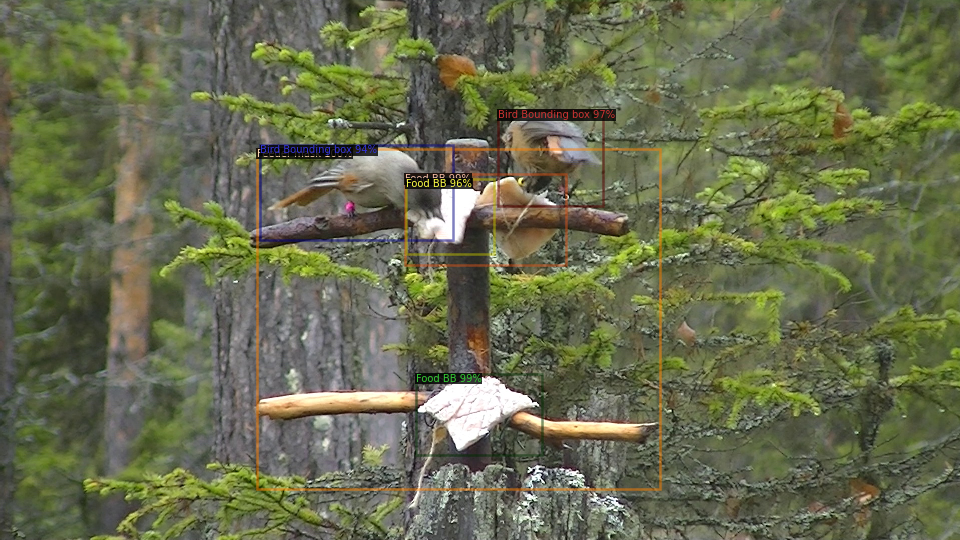

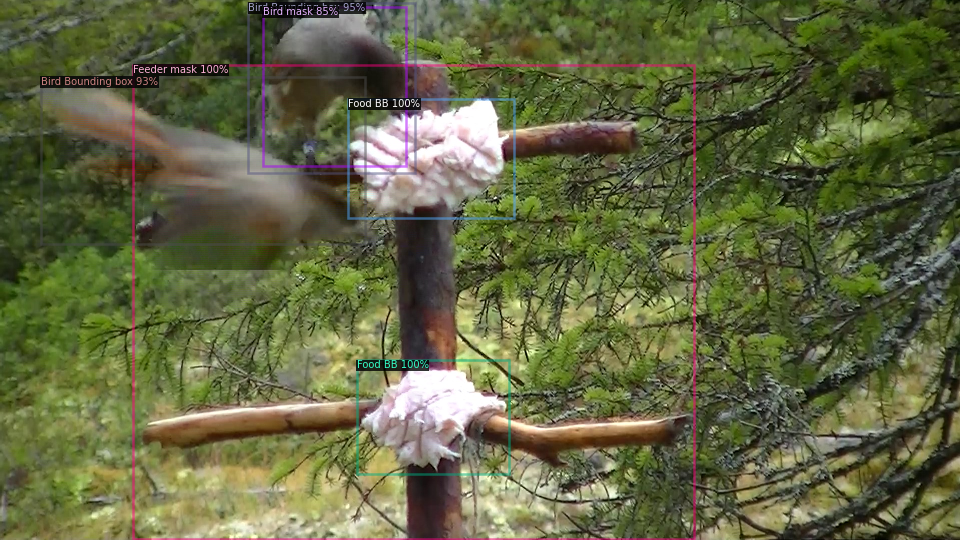

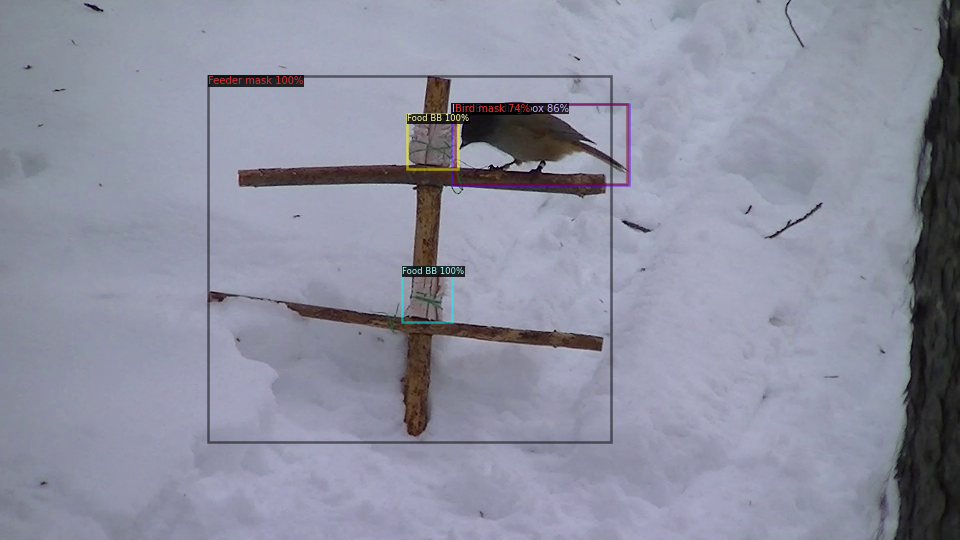

In [30]:
from detectron2.utils.visualizer import Visualizer, ColorMode
dataset_dicts = DatasetCatalog.get("my_dataset_val") 
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=bird_metadata, 
                   scale=0.5, 
                   #instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [39]:


#evaluate performance:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", False, output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`


[06/21 23:15:48 d2.data.datasets.coco]: Loaded 230 images in COCO format from /content/drive/MyDrive/dataset_detectron_13_june/val/annotations.json
[06/21 23:15:48 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[06/21 23:15:48 d2.data.common]: Serializing 230 elements to byte tensors and concatenating them all ...
[06/21 23:15:48 d2.data.common]: Serialized dataset takes 0.48 MiB
[06/21 23:15:48 d2.evaluation.evaluator]: Start inference on 230 batches


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:490: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


[06/21 23:15:58 d2.evaluation.evaluator]: Inference done 11/230. Dataloading: 0.0017 s/iter. Inference: 0.4422 s/iter. Eval: 0.0002 s/iter. Total: 0.4441 s/iter. ETA=0:01:37
[06/21 23:16:03 d2.evaluation.evaluator]: Inference done 23/230. Dataloading: 0.0020 s/iter. Inference: 0.4425 s/iter. Eval: 0.0002 s/iter. Total: 0.4449 s/iter. ETA=0:01:32
[06/21 23:16:09 d2.evaluation.evaluator]: Inference done 35/230. Dataloading: 0.0022 s/iter. Inference: 0.4424 s/iter. Eval: 0.0002 s/iter. Total: 0.4450 s/iter. ETA=0:01:26
[06/21 23:16:14 d2.evaluation.evaluator]: Inference done 47/230. Dataloading: 0.0023 s/iter. Inference: 0.4446 s/iter. Eval: 0.0002 s/iter. Total: 0.4473 s/iter. ETA=0:01:21
[06/21 23:16:20 d2.evaluation.evaluator]: Inference done 59/230. Dataloading: 0.0022 s/iter. Inference: 0.4449 s/iter. Eval: 0.0002 s/iter. Total: 0.4475 s/iter. ETA=0:01:16
[06/21 23:16:25 d2.evaluation.evaluator]: Inference done 71/230. Dataloading: 0.0022 s/iter. Inference: 0.4443 s/iter. Eval: 0.000

# Other types of builtin models

We showcase simple demos of other types of models below:

# Run panoptic segmentation on a video

In [79]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0


In [80]:
from detectron2.projects.point_rend import add_pointrend_config
cfg = get_cfg()    # obtain detectron2's default config
add_pointrend_config(cfg)  # add pointrend's default config

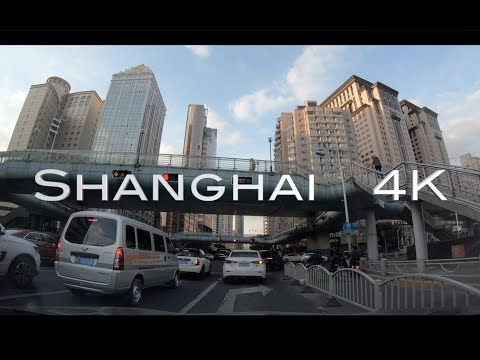

In [ ]:
# This is the video we're going to process
from IPython.display import YouTubeVideo, display
video = YouTubeVideo("ll8TgCZ0plk", width=500)
display(video)

In [86]:

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
# import some common libraries
import numpy as np
import tqdm
import cv2
# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.video_visualizer import VideoVisualizer
from detectron2.utils.visualizer import ColorMode, Visualizer
from detectron2.data import MetadataCatalog
import time

# Extract video properties
video = cv2.VideoCapture('/content/video-clip-test.mp4')
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
frames_per_second = video.get(cv2.CAP_PROP_FPS)
num_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# Initialize video writer
video_writer = cv2.VideoWriter('out.mp4', fourcc=cv2.VideoWriter_fourcc(*"mp4v"), fps=float(frames_per_second), frameSize=(width, height), isColor=True)

# Initialize predictor
cfg = get_cfg()
cfg.merge_from_file("/content/output.yaml")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7  # set threshold for this model
cfg.MODEL.WEIGHTS = "/content/output/model_final.pth"
#cfg.merge_from_list(["MODEL.WEIGHTS", "model_final.pth"])
predictor = DefaultPredictor(cfg)

# Initialize visualizer
v = VideoVisualizer(MetadataCatalog.get("my_dataset_val"), ColorMode.IMAGE)

def runOnVideo(video, maxFrames):
    """ Runs the predictor on every frame in the video (unless maxFrames is given),
    and returns the frame with the predictions drawn.
    """

    readFrames = 0
    while True:
        hasFrame, frame = video.read()
        if not hasFrame:
            break

        # Get prediction results for this frame
        outputs = predictor(frame)

        # Make sure the frame is colored
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

        # Draw a visualization of the predictions using the video visualizer
        visualization = v.draw_instance_predictions(frame, outputs["instances"].to("cpu"))

        # Convert Matplotlib RGB format to OpenCV BGR format
        visualization = cv2.cvtColor(visualization.get_image(), cv2.COLOR_RGB2BGR)

        yield visualization

        readFrames += 1
        if readFrames > maxFrames:
            break

# Create a cut-off for debugging
num_frames = 120

# Enumerate the frames of the video
for visualization in tqdm.tqdm(runOnVideo(video, num_frames), total=num_frames):

    # Write test image
    cv2.imwrite('POSE detectron2.png', visualization)

    # Write to video file
    video_writer.write(visualization)

# Release resources
video.release()
video_writer.release()
cv2.destroyAllWindows()

[06/22 02:15:08 fvcore.common.checkpoint]: [Checkpointer] Loading from /content/output/model_final.pth ...
WARNING [06/22 02:15:08 d2.checkpoint.c2_model_loading]: Shape of proposal_generator.rpn_head.anchor_deltas.bias in checkpoint is torch.Size([12]), while shape of proposal_generator.rpn_head.anchor_deltas.bias in model is torch.Size([60]).
WARNING [06/22 02:15:08 d2.checkpoint.c2_model_loading]: proposal_generator.rpn_head.anchor_deltas.bias will not be loaded. Please double check and see if this is desired.
WARNING [06/22 02:15:08 d2.checkpoint.c2_model_loading]: Shape of proposal_generator.rpn_head.anchor_deltas.weight in checkpoint is torch.Size([12, 256, 1, 1]), while shape of proposal_generator.rpn_head.anchor_deltas.weight in model is torch.Size([60, 1024, 1, 1]).
WARNING [06/22 02:15:09 d2.checkpoint.c2_model_loading]: proposal_generator.rpn_head.anchor_deltas.weight will not be loaded. Please double check and see if this is desired.
WARNING [06/22 02:15:09 d2.checkpoint.c2

 65%|██████▌   | 78/120 [00:29<00:15,  2.65it/s]


IndexError: ignored

In [55]:
from detectron2.checkpoint import DetectionCheckpointer
DetectionCheckpointer(model).load('/content/output/model_final.pth')  # load a file, usually from cfg.MODEL.WEIGHTS

checkpointer = DetectionCheckpointer(model, save_dir="output")
checkpointer.save("model_999")  # save to output/model_999.pth

NameError: ignored

In [61]:
from configparser import ConfigParser
config = ConfigParser()

config.read('config.ini')
config.add_section('main')
config.set('main', 'key1', 'value1')
config.set('main', 'key2', 'value2')
config.set('main', 'key3', 'value3')

with open('config.ini', 'w') as f:
    config.write(f)

DuplicateSectionError: ignored

In [62]:
print(cfg.dump)

<bound method CfgNode.dump of CfgNode({'VERSION': 2, 'MODEL': CfgNode({'LOAD_PROPOSALS': False, 'MASK_ON': False, 'KEYPOINT_ON': False, 'DEVICE': 'cuda', 'META_ARCHITECTURE': 'GeneralizedRCNN', 'WEIGHTS': '', 'PIXEL_MEAN': [103.53, 116.28, 123.675], 'PIXEL_STD': [1.0, 1.0, 1.0], 'BACKBONE': CfgNode({'NAME': 'build_resnet_backbone', 'FREEZE_AT': 2}), 'FPN': CfgNode({'IN_FEATURES': [], 'OUT_CHANNELS': 256, 'NORM': '', 'FUSE_TYPE': 'sum'}), 'PROPOSAL_GENERATOR': CfgNode({'NAME': 'RPN', 'MIN_SIZE': 0}), 'ANCHOR_GENERATOR': CfgNode({'NAME': 'DefaultAnchorGenerator', 'SIZES': [[32, 64, 128, 256, 512]], 'ASPECT_RATIOS': [[0.5, 1.0, 2.0]], 'ANGLES': [[-90, 0, 90]], 'OFFSET': 0.0}), 'RPN': CfgNode({'HEAD_NAME': 'StandardRPNHead', 'IN_FEATURES': ['res4'], 'BOUNDARY_THRESH': -1, 'IOU_THRESHOLDS': [0.3, 0.7], 'IOU_LABELS': [0, -1, 1], 'BATCH_SIZE_PER_IMAGE': 256, 'POSITIVE_FRACTION': 0.5, 'BBOX_REG_LOSS_TYPE': 'smooth_l1', 'BBOX_REG_LOSS_WEIGHT': 1.0, 'BBOX_REG_WEIGHTS': (1.0, 1.0, 1.0, 1.0), 'SMO

In [46]:
from detectron2.config import global_cfg
print(global_cfg.KEY)

AttributeError: ignored

In [87]:
# Run frame-by-frame inference demo on this video (takes 3-4 minutes) with the "demo.py" tool we provided in the repo.
!git clone https://github.com/facebookresearch/detectron2
# Note: this is currently BROKEN due to missing codec. See https://github.com/facebookresearch/detectron2/issues/2901 for workaround.
%run detectron2/demo/demo.py --config-file /content/output.yaml --video-input /content/video-clip-test.mp4 --confidence-threshold 0.6 --output /content/video-output-test.mp4 --opts MODEL.WEIGHTS /content/output/model_final.pth

fatal: destination path 'detectron2' already exists and is not an empty directory.
[06/22 02:18:27 detectron2]: Arguments: Namespace(confidence_threshold=0.6, config_file='/content/output.yaml', input=None, opts=['MODEL.WEIGHTS', '/content/output/model_final.pth'], output='/content/video-output-test.mp4', video_input='/content/video-clip-test.mp4', webcam=False)
[06/22 02:18:28 fvcore.common.checkpoint]: [Checkpointer] Loading from /content/output/model_final.pth ...
WARNING [06/22 02:18:29 d2.checkpoint.c2_model_loading]: Shape of proposal_generator.rpn_head.anchor_deltas.bias in checkpoint is torch.Size([12]), while shape of proposal_generator.rpn_head.anchor_deltas.bias in model is torch.Size([60]).
WARNING [06/22 02:18:29 d2.checkpoint.c2_model_loading]: proposal_generator.rpn_head.anchor_deltas.bias will not be loaded. Please double check and see if this is desired.
WARNING [06/22 02:18:29 d2.checkpoint.c2_model_loading]: Shape of proposal_generator.rpn_head.anchor_deltas.weight i

100%|██████████| 982/982 [04:24<00:00,  3.71it/s]


In [ ]:
# Download the results
from google.colab import files
files.download('video-output.mkv')